In [15]:
import numpy as np
import matplotlib.pyplot as plt

from scipy.stats import beta

seed = 1234



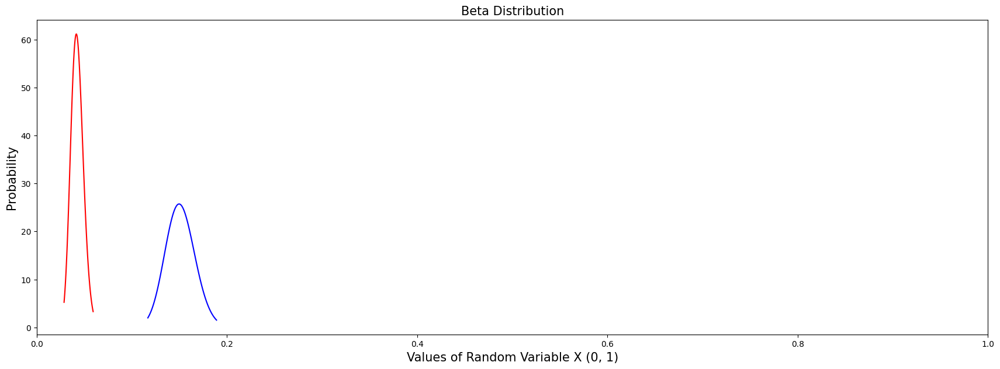

In [16]:
# Set the shape paremeters
#
a1, b1 = 40, 900
a2, b2 = 80, 450

# Generate the value between
#
x1 = np.linspace(beta.ppf(0.01, a1, b1),beta.ppf(0.99, a1, b1), 100)
x2 = np.linspace(beta.ppf(0.01, a2, b2),beta.ppf(0.99, a2, b2), 100)

# Plot the beta distribution
#
plt.figure(figsize=(21,7))
plt.xlim(0, 1)
plt.plot(x1, beta.pdf(x1, a1, b1), 'r-')
plt.plot(x2, beta.pdf(x2, a2, b2), 'b-')
plt.title('Beta Distribution', fontsize='15')
plt.xlabel('Values of Random Variable X (0, 1)', fontsize='15')
plt.ylabel('Probability', fontsize='15')
plt.show()

In [17]:
# setting the seed for reproducibility
np.random.seed(seed)

parameter_estimation_sample = beta.rvs(a1, b1, size=100)
stable_sample = beta.rvs(a1, b1, size=10000)
novelty_sample = beta.rvs(a2, b2, size=5000)


In [18]:
beta.fit(parameter_estimation_sample, method="MM")

/home/pedro/anaconda3/envs/omop/lib/python3.11/site-packages/scipy/stats/_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
/home/pedro/anaconda3/envs/omop/lib/python3.11/site-packages/scipy/stats/_continuous_distns.py:723: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))


(44979132.98436591, 61.77204973476411, -34175.366571993596, 34174.621780841015)

In [19]:
from typing import List
from src.change_detector.stats_and_distance.stats_and_distance import iter_geo_mean_estimator, geo_mean

def update_geo_mean_estimators(new_dist: float, dist_geo_mean, complementary_dist_geo_mean, run_order:int = 1, order_limit:int|None = None) -> (float, float):
    dist_geo_mean, complementary_dist_geo_mean = (
        iter_geo_mean_estimator(x1, run_order, x2, order_limit=order_limit) for x1, x2 in
        [(new_dist, dist_geo_mean), (1-new_dist, complementary_dist_geo_mean)]
    )
    return dist_geo_mean, complementary_dist_geo_mean

def update_beta_distribution_parameters(
                            new_dist: float, 
                            run_order:int, 
                            old_dist_geo_mean:float, 
                            old_complementary_dist_geo_mean:float,
                            order_limit:int|None = None
                            ) -> None:
    
    if run_order == 1:
        dist_geo_mean, complementary_dist_geo_mean = new_dist, 1-new_dist
    else:    
        dist_geo_mean, complementary_dist_geo_mean = update_geo_mean_estimators(new_dist, old_dist_geo_mean, old_complementary_dist_geo_mean, run_order, order_limit)
        estimated_alpha = 1/2+dist_geo_mean/(2*(1-dist_geo_mean-complementary_dist_geo_mean))
        estimated_beta =  1/2+complementary_dist_geo_mean/(2*(1-dist_geo_mean-complementary_dist_geo_mean))
    return estimated_alpha, estimated_beta, dist_geo_mean, complementary_dist_geo_mean
    # print("new alpha:", self._estimated_alpha, "  new beta:", self._estimated_beta)
    # print("geo_mean:", self._dist_geo_mean, "  complementary geo_mean:", self._complementary_dist_geo_mean)
    
def update_beta_distribution_parameters_window(
                            distances_window:List[float]
                            ) -> None:
    dist_geo_mean, complementary_dist_geo_mean = geo_mean(distances_window), geo_mean([1-dist for dist in distances_window])
    estimated_alpha = 1/2+dist_geo_mean/(2*(1-dist_geo_mean-complementary_dist_geo_mean))
    estimated_beta =  1/2+complementary_dist_geo_mean/(2*(1-dist_geo_mean-complementary_dist_geo_mean))
    return estimated_alpha, estimated_beta, dist_geo_mean, complementary_dist_geo_mean

In [20]:
from src.change_detector.stats_and_distance.stats_and_distance import geo_mean

alpha_estimates_proposed = []
beta_estimates_proposed = []

run_order = len(parameter_estimation_sample)

dist_geo_mean, complementary_dist_geo_mean = geo_mean(parameter_estimation_sample), geo_mean([1-dist for dist in parameter_estimation_sample])

for dist in stable_sample:
    run_order += 1
    print("run order:", run_order)
    estimated_alpha, estimated_beta, dist_geo_mean, complementary_dist_geo_mean = update_beta_distribution_parameters(dist, run_order, dist_geo_mean, complementary_dist_geo_mean)
    alpha_estimates_proposed.append(estimated_alpha)
    beta_estimates_proposed.append(estimated_beta)
    print("new alpha:", estimated_alpha, "  new beta:", estimated_beta)
    print("geo_mean:", dist, "  complementary geo_mean:", 1-dist)
    
    
for dist in novelty_sample:
    run_order += 1
    print("run order:", run_order)
    estimated_alpha, estimated_beta, dist_geo_mean, complementary_dist_geo_mean = update_beta_distribution_parameters(dist, run_order, dist_geo_mean, complementary_dist_geo_mean)
    alpha_estimates_proposed.append(estimated_alpha)
    beta_estimates_proposed.append(estimated_beta)
    print("new alpha:", estimated_alpha, "  new beta:", estimated_beta)
    print("geo_mean:", dist, "  complementary geo_mean:", 1-dist)

run order: 101
new alpha: 47.102585216128844   new beta: 1041.4910463252133
geo_mean: 0.03652224394174516   complementary geo_mean: 0.9634777560582548
run order: 102
new alpha: 47.155921463499986   new beta: 1044.0473827616286
geo_mean: 0.037696124750062135   complementary geo_mean: 0.9623038752499379
run order: 103
new alpha: 46.5032183621149   new beta: 1031.7775742110312
geo_mean: 0.03420868748242988   complementary geo_mean: 0.9657913125175701
run order: 104
new alpha: 46.38638445079959   new beta: 1027.4150446883725
geo_mean: 0.0505255172872312   complementary geo_mean: 0.9494744827127688
run order: 105
new alpha: 46.64795508497124   new beta: 1032.2260471780055
geo_mean: 0.047332424976423836   complementary geo_mean: 0.9526675750235761
run order: 106
new alpha: 45.24341770987474   new beta: 997.9039052475332
geo_mean: 0.05747805497313604   complementary geo_mean: 0.9425219450268639
run order: 107
new alpha: 45.46961071154732   new beta: 1001.8794026291386
geo_mean: 0.047866429028

In [21]:
alpha_estimates_truncated = []
beta_estimates_truncated = []

#set max order value, "truncating" the geo mean estimation
order_limit = 100

run_order = len(parameter_estimation_sample)

dist_geo_mean, complementary_dist_geo_mean = geo_mean(parameter_estimation_sample), geo_mean([1-dist for dist in parameter_estimation_sample])

for dist in stable_sample:
    run_order += 1
    print("run order:", run_order)
    estimated_alpha, estimated_beta, dist_geo_mean, complementary_dist_geo_mean = update_beta_distribution_parameters(dist, run_order, dist_geo_mean, complementary_dist_geo_mean, order_limit)
    alpha_estimates_truncated.append(estimated_alpha)
    beta_estimates_truncated.append(estimated_beta)
    print("new alpha:", estimated_alpha, "  new beta:", estimated_beta)
    print("geo_mean:", dist, "  complementary geo_mean:", 1-dist)
    
    
for dist in novelty_sample:
    run_order += 1
    print("run order:", run_order)
    estimated_alpha, estimated_beta, dist_geo_mean, complementary_dist_geo_mean = update_beta_distribution_parameters(dist, run_order, dist_geo_mean, complementary_dist_geo_mean, order_limit)
    alpha_estimates_truncated.append(estimated_alpha)
    beta_estimates_truncated.append(estimated_beta)
    print("new alpha:", estimated_alpha, "  new beta:", estimated_beta)
    print("geo_mean:", dist, "  complementary geo_mean:", 1-dist)

run order: 101
new alpha: 47.10103172765774   new beta: 1041.4736621035217
geo_mean: 0.03652224394174516   complementary geo_mean: 0.9634777560582548
run order: 102
new alpha: 47.15561434474234   new beta: 1044.085017005131
geo_mean: 0.037696124750062135   complementary geo_mean: 0.9623038752499379
run order: 103
new alpha: 46.484279317337396   new beta: 1031.4664600615463
geo_mean: 0.03420868748242988   complementary geo_mean: 0.9657913125175701
run order: 104
new alpha: 46.36256099274845   new beta: 1026.9240714785508
geo_mean: 0.0505255172872312   complementary geo_mean: 0.9494744827127688
run order: 105
new alpha: 46.63719765983693   new beta: 1031.975410953935
geo_mean: 0.047332424976423836   complementary geo_mean: 0.9526675750235761
run order: 106
new alpha: 45.153331279502424   new beta: 995.7114150776321
geo_mean: 0.05747805497313604   complementary geo_mean: 0.9425219450268639
run order: 107
new alpha: 45.396392599776064   new beta: 999.9912242942654
geo_mean: 0.0478664290288

In [22]:
alpha_estimates_window = []
beta_estimates_window = []

#set max order value, "truncating" the geo mean estimation
window_size= 100 #NOTE: must be smaller than starting window size of parameter_estimation_sample

run_order = len(parameter_estimation_sample)

dist_geo_mean, complementary_dist_geo_mean = geo_mean(parameter_estimation_sample), geo_mean([1-dist for dist in parameter_estimation_sample])

distances_window = parameter_estimation_sample.tolist()[-window_size:]

for dist in stable_sample:
    run_order += 1
    print("run order:", run_order)
    distances_window.append(dist)
    distances_window.pop(0)
    # print(len(distances_window))
    estimated_alpha, estimated_beta, dist_geo_mean, complementary_dist_geo_mean = update_beta_distribution_parameters_window(distances_window)
    alpha_estimates_window.append(estimated_alpha)
    beta_estimates_window.append(estimated_beta)
    print("new alpha:", estimated_alpha, "  new beta:", estimated_beta)
    print("geo_mean:", dist, "  complementary geo_mean:", 1-dist)
    
    
for dist in novelty_sample:
    run_order += 1
    print("run order:", run_order)
    distances_window.append(dist)
    distances_window.pop(0)    
    # print(len(distances_window))
    estimated_alpha, estimated_beta, dist_geo_mean, complementary_dist_geo_mean = update_beta_distribution_parameters_window(distances_window)
    alpha_estimates_window.append(estimated_alpha)
    beta_estimates_window.append(estimated_beta)
    print("new alpha:", estimated_alpha, "  new beta:", estimated_beta)
    print("geo_mean:", dist, "  complementary geo_mean:", 1-dist)

run order: 101
new alpha: 46.80478633775989   new beta: 1035.8599649744854
geo_mean: 0.03652224394174516   complementary geo_mean: 0.9634777560582548
run order: 102
new alpha: 46.97437523832128   new beta: 1039.3628192352942
geo_mean: 0.037696124750062135   complementary geo_mean: 0.9623038752499379
run order: 103
new alpha: 45.916594291371815   new beta: 1018.739107497084
geo_mean: 0.03420868748242988   complementary geo_mean: 0.9657913125175701
run order: 104
new alpha: 46.13366997812952   new beta: 1023.8898299654886
geo_mean: 0.0505255172872312   complementary geo_mean: 0.9494744827127688
run order: 105
new alpha: 45.959671342467665   new beta: 1019.3214824142104
geo_mean: 0.047332424976423836   complementary geo_mean: 0.9526675750235761
run order: 106
new alpha: 44.09535185514765   new beta: 974.2739662574511
geo_mean: 0.05747805497313604   complementary geo_mean: 0.9425219450268639
run order: 107
new alpha: 44.60955325691185   new beta: 986.6148734998109
geo_mean: 0.0478664290288

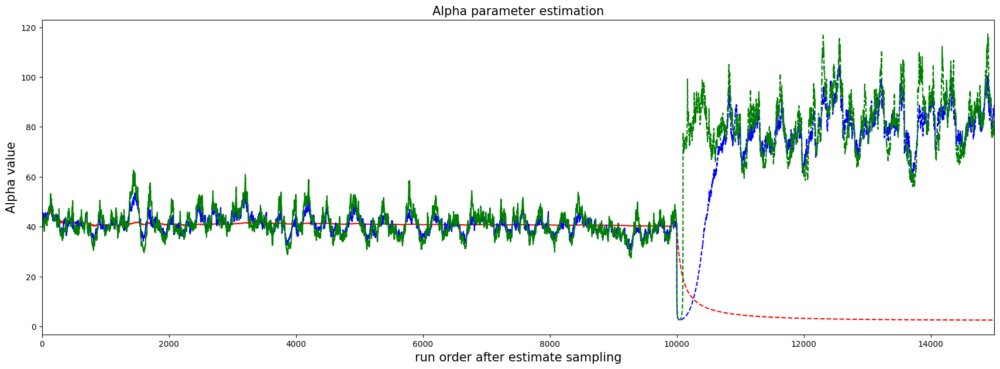

In [23]:
plt.figure(figsize=(21,7))
plt.xlim(0, 15000)
plt.plot(range(len(stable_sample)), alpha_estimates_proposed[:stable_sample.shape[0]], 'r-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), alpha_estimates_proposed[-novelty_sample.shape[0]-1:], 'r--')
plt.plot(range(len(stable_sample)), alpha_estimates_truncated[:stable_sample.shape[0]], 'b-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), alpha_estimates_truncated[-novelty_sample.shape[0]-1:], 'b--')
plt.plot(range(len(stable_sample)), alpha_estimates_window[:stable_sample.shape[0]], 'g-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), alpha_estimates_window[-novelty_sample.shape[0]-1:], 'g--')
plt.title("Alpha parameter estimation", fontsize='15')
plt.xlabel('run order after estimate sampling', fontsize='15')
plt.ylabel('Alpha value', fontsize='15')
plt.show()

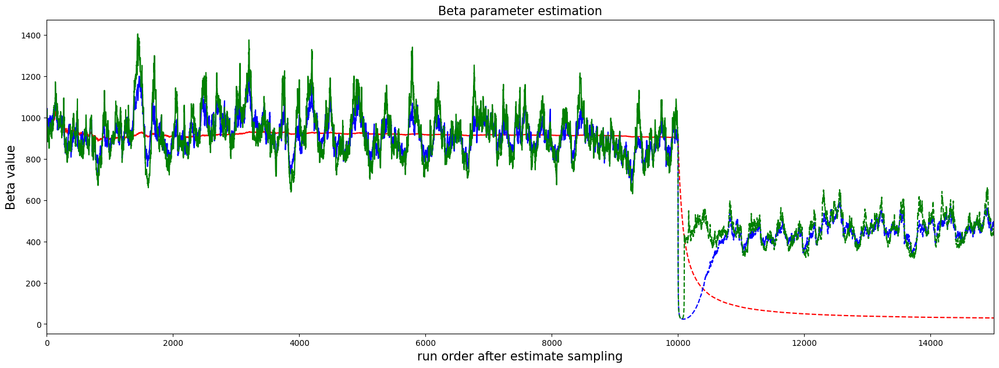

In [24]:
plt.figure(figsize=(21,7))
plt.xlim(0, 15000)
plt.plot(range(len(stable_sample)), beta_estimates_proposed[:stable_sample.shape[0]], 'r-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), beta_estimates_proposed[-novelty_sample.shape[0]-1:], 'r--')
plt.plot(range(len(stable_sample)), beta_estimates_truncated[:stable_sample.shape[0]], 'b-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), beta_estimates_truncated[-novelty_sample.shape[0]-1:], 'b--')
plt.plot(range(len(stable_sample)), beta_estimates_window[:stable_sample.shape[0]], 'g-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), beta_estimates_window[-novelty_sample.shape[0]-1:], 'g--')
plt.title("Beta parameter estimation", fontsize='15')
plt.xlabel('run order after estimate sampling', fontsize='15')
plt.ylabel('Beta value', fontsize='15')
plt.show()

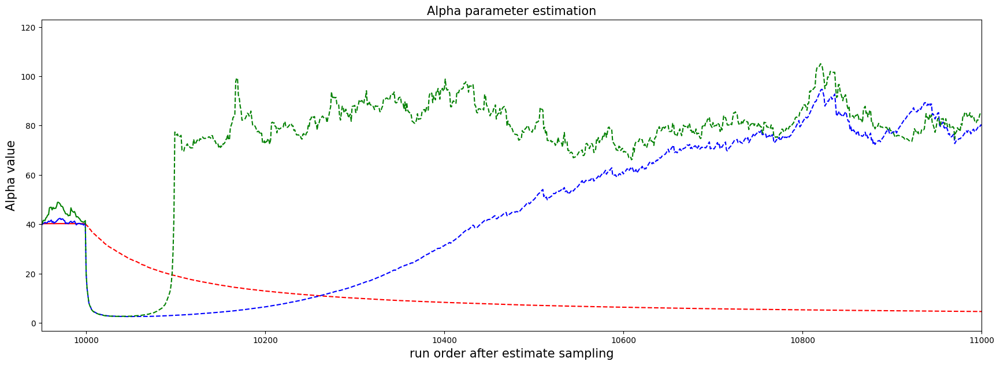

In [25]:
plt.figure(figsize=(21,7))
plt.xlim(9950, 11000)
plt.plot(range(len(stable_sample)), alpha_estimates_proposed[:stable_sample.shape[0]], 'r-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), alpha_estimates_proposed[-novelty_sample.shape[0]-1:], 'r--')
plt.plot(range(len(stable_sample)), alpha_estimates_truncated[:stable_sample.shape[0]], 'b-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), alpha_estimates_truncated[-novelty_sample.shape[0]-1:], 'b--')
plt.plot(range(len(stable_sample)), alpha_estimates_window[:stable_sample.shape[0]], 'g-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), alpha_estimates_window[-novelty_sample.shape[0]-1:], 'g--')
plt.title("Alpha parameter estimation", fontsize='15')
plt.xlabel('run order after estimate sampling', fontsize='15')
plt.ylabel('Alpha value', fontsize='15')
plt.show()

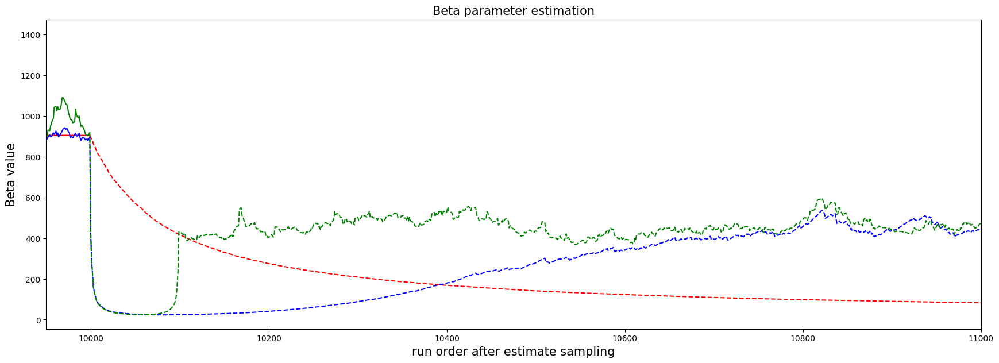

In [26]:
plt.figure(figsize=(21,7))
plt.xlim(9950, 11000)
plt.plot(range(len(stable_sample)), beta_estimates_proposed[:stable_sample.shape[0]], 'r-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), beta_estimates_proposed[-novelty_sample.shape[0]-1:], 'r--')
plt.plot(range(len(stable_sample)), beta_estimates_truncated[:stable_sample.shape[0]], 'b-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), beta_estimates_truncated[-novelty_sample.shape[0]-1:], 'b--')
plt.plot(range(len(stable_sample)), beta_estimates_window[:stable_sample.shape[0]], 'g-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), beta_estimates_window[-novelty_sample.shape[0]-1:], 'g--')
plt.title("Beta parameter estimation", fontsize='15')
plt.xlabel('run order after estimate sampling', fontsize='15')
plt.ylabel('Beta value', fontsize='15')
plt.show()

In [27]:
alpha_estimates_truncated[9998:10010], alpha_estimates_window[9998:10010]

([40.029546285192495,
  40.37446487977037,
  19.74909686822444,
  13.929577806274802,
  11.03733200427884,
  8.112628555264518,
  7.01871132124637,
  6.332872729390963,
  5.42846074563682,
  4.986059238758297,
  4.628703883318092,
  4.4103538285393284],
 [40.96381332354951,
  41.389745164075585,
  19.949819505438487,
  14.004034337475302,
  11.124744268892396,
  8.123096544333205,
  6.994697925187193,
  6.268129491931589,
  5.39083841327918,
  4.9203547003342765,
  4.5600881599950185,
  4.326476981073535])

In [ ]:
## How robust are alternatives?

In [29]:
# setting the seed for reproducibility
np.random.seed(seed)

parameter_estimation_sample = beta.rvs(a1, b1, size=100)
stable_sample = beta.rvs(a1, b1, size=10000)
novelty_sample = beta.rvs(a2, b2, size=6000)

#replace with stable sample at // 1000

for i in (1000, 2000, 2001, 3000, 3001, 3002, 4000, 4001, 4002, 4003, 5000, 5001, 5002, 5003, 5004):
    novelty_sample[i] = beta.rvs(a1, b1)

In [30]:
from src.change_detector.stats_and_distance.stats_and_distance import geo_mean

alpha_estimates_proposed = []
beta_estimates_proposed = []

run_order = len(parameter_estimation_sample)

dist_geo_mean, complementary_dist_geo_mean = geo_mean(parameter_estimation_sample), geo_mean([1-dist for dist in parameter_estimation_sample])

for dist in stable_sample:
    run_order += 1
    print("run order:", run_order)
    estimated_alpha, estimated_beta, dist_geo_mean, complementary_dist_geo_mean = update_beta_distribution_parameters(dist, run_order, dist_geo_mean, complementary_dist_geo_mean)
    alpha_estimates_proposed.append(estimated_alpha)
    beta_estimates_proposed.append(estimated_beta)
    print("new alpha:", estimated_alpha, "  new beta:", estimated_beta)
    print("geo_mean:", dist, "  complementary geo_mean:", 1-dist)
    
    
for dist in novelty_sample:
    run_order += 1
    print("run order:", run_order)
    estimated_alpha, estimated_beta, dist_geo_mean, complementary_dist_geo_mean = update_beta_distribution_parameters(dist, run_order, dist_geo_mean, complementary_dist_geo_mean)
    alpha_estimates_proposed.append(estimated_alpha)
    beta_estimates_proposed.append(estimated_beta)
    print("new alpha:", estimated_alpha, "  new beta:", estimated_beta)
    print("geo_mean:", dist, "  complementary geo_mean:", 1-dist)

run order: 101
new alpha: 47.102585216128844   new beta: 1041.4910463252133
geo_mean: 0.03652224394174516   complementary geo_mean: 0.9634777560582548
run order: 102
new alpha: 47.155921463499986   new beta: 1044.0473827616286
geo_mean: 0.037696124750062135   complementary geo_mean: 0.9623038752499379
run order: 103
new alpha: 46.5032183621149   new beta: 1031.7775742110312
geo_mean: 0.03420868748242988   complementary geo_mean: 0.9657913125175701
run order: 104
new alpha: 46.38638445079959   new beta: 1027.4150446883725
geo_mean: 0.0505255172872312   complementary geo_mean: 0.9494744827127688
run order: 105
new alpha: 46.64795508497124   new beta: 1032.2260471780055
geo_mean: 0.047332424976423836   complementary geo_mean: 0.9526675750235761
run order: 106
new alpha: 45.24341770987474   new beta: 997.9039052475332
geo_mean: 0.05747805497313604   complementary geo_mean: 0.9425219450268639
run order: 107
new alpha: 45.46961071154732   new beta: 1001.8794026291386
geo_mean: 0.047866429028

In [58]:
alpha_estimates_truncated = []
beta_estimates_truncated = []

#set max order value, "truncating" the geo mean estimation
order_limit = 100

run_order = len(parameter_estimation_sample)

dist_geo_mean, complementary_dist_geo_mean = geo_mean(parameter_estimation_sample), geo_mean([1-dist for dist in parameter_estimation_sample])

for dist in stable_sample:
    run_order += 1
    print("run order:", run_order)
    estimated_alpha, estimated_beta, dist_geo_mean, complementary_dist_geo_mean = update_beta_distribution_parameters(dist, run_order, dist_geo_mean, complementary_dist_geo_mean, order_limit)
    alpha_estimates_truncated.append(estimated_alpha)
    beta_estimates_truncated.append(estimated_beta)
    print("new alpha:", estimated_alpha, "  new beta:", estimated_beta)
    print("geo_mean:", dist, "  complementary geo_mean:", 1-dist)
    
    
for dist in novelty_sample:
    run_order += 1
    print("run order:", run_order)
    estimated_alpha, estimated_beta, dist_geo_mean, complementary_dist_geo_mean = update_beta_distribution_parameters(dist, run_order, dist_geo_mean, complementary_dist_geo_mean, order_limit)
    alpha_estimates_truncated.append(estimated_alpha)
    beta_estimates_truncated.append(estimated_beta)
    print("new alpha:", estimated_alpha, "  new beta:", estimated_beta)
    print("geo_mean:", dist, "  complementary geo_mean:", 1-dist)

run order: 101
new alpha: 47.10103172765774   new beta: 1041.4736621035217
geo_mean: 0.03652224394174516   complementary geo_mean: 0.9634777560582548
run order: 102
new alpha: 47.15561434474234   new beta: 1044.085017005131
geo_mean: 0.037696124750062135   complementary geo_mean: 0.9623038752499379
run order: 103
new alpha: 46.484279317337396   new beta: 1031.4664600615463
geo_mean: 0.03420868748242988   complementary geo_mean: 0.9657913125175701
run order: 104
new alpha: 46.36256099274845   new beta: 1026.9240714785508
geo_mean: 0.0505255172872312   complementary geo_mean: 0.9494744827127688
run order: 105
new alpha: 46.63719765983693   new beta: 1031.975410953935
geo_mean: 0.047332424976423836   complementary geo_mean: 0.9526675750235761
run order: 106
new alpha: 45.153331279502424   new beta: 995.7114150776321
geo_mean: 0.05747805497313604   complementary geo_mean: 0.9425219450268639
run order: 107
new alpha: 45.396392599776064   new beta: 999.9912242942654
geo_mean: 0.0478664290288

In [59]:
alpha_estimates_window = []
beta_estimates_window = []

#set max order value, "truncating" the geo mean estimation
window_size= 100 #NOTE: should be smaller than starting window size of parameter_estimation_sample

run_order = len(parameter_estimation_sample)

dist_geo_mean, complementary_dist_geo_mean = geo_mean(parameter_estimation_sample), geo_mean([1-dist for dist in parameter_estimation_sample])

distances_window = parameter_estimation_sample.tolist()[-window_size:]

for dist in stable_sample:
    run_order += 1
    print("run order:", run_order)
    distances_window.append(dist)
    if len(distances_window) > window_size:
        distances_window.pop(0)
    # print(len(distances_window))
    estimated_alpha, estimated_beta, dist_geo_mean, complementary_dist_geo_mean = update_beta_distribution_parameters_window(distances_window)
    alpha_estimates_window.append(estimated_alpha)
    beta_estimates_window.append(estimated_beta)
    print("new alpha:", estimated_alpha, "  new beta:", estimated_beta)
    print("geo_mean:", dist, "  complementary geo_mean:", 1-dist)
    
    
for dist in novelty_sample:
    run_order += 1
    print("run order:", run_order)
    distances_window.append(dist)
    distances_window.pop(0)    
    # print(len(distances_window))
    estimated_alpha, estimated_beta, dist_geo_mean, complementary_dist_geo_mean = update_beta_distribution_parameters_window(distances_window)
    alpha_estimates_window.append(estimated_alpha)
    beta_estimates_window.append(estimated_beta)
    print("new alpha:", estimated_alpha, "  new beta:", estimated_beta)
    print("geo_mean:", dist, "  complementary geo_mean:", 1-dist)

run order: 101
new alpha: 46.80478633775989   new beta: 1035.8599649744854
geo_mean: 0.03652224394174516   complementary geo_mean: 0.9634777560582548
run order: 102
new alpha: 46.97437523832128   new beta: 1039.3628192352942
geo_mean: 0.037696124750062135   complementary geo_mean: 0.9623038752499379
run order: 103
new alpha: 45.916594291371815   new beta: 1018.739107497084
geo_mean: 0.03420868748242988   complementary geo_mean: 0.9657913125175701
run order: 104
new alpha: 46.13366997812952   new beta: 1023.8898299654886
geo_mean: 0.0505255172872312   complementary geo_mean: 0.9494744827127688
run order: 105
new alpha: 45.959671342467665   new beta: 1019.3214824142104
geo_mean: 0.047332424976423836   complementary geo_mean: 0.9526675750235761
run order: 106
new alpha: 44.09535185514765   new beta: 974.2739662574511
geo_mean: 0.05747805497313604   complementary geo_mean: 0.9425219450268639
run order: 107
new alpha: 44.60955325691185   new beta: 986.6148734998109
geo_mean: 0.0478664290288

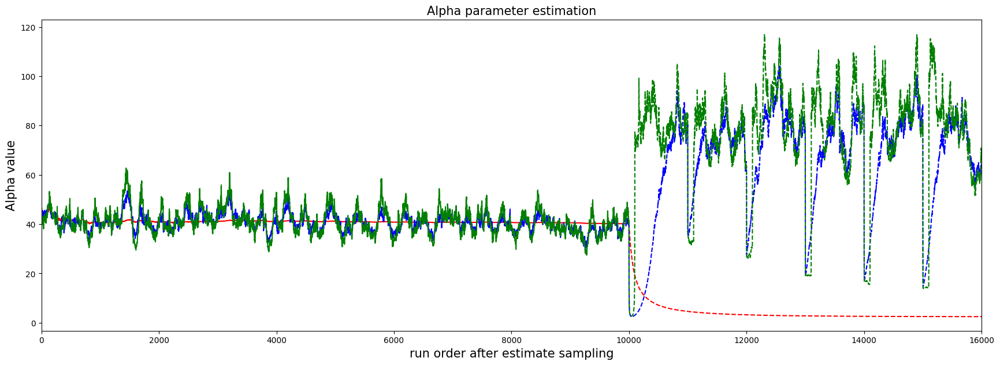

In [60]:
plt.figure(figsize=(21,7))
plt.xlim(0, 16000)
plt.plot(range(len(stable_sample)), alpha_estimates_proposed[:stable_sample.shape[0]], 'r-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), alpha_estimates_proposed[-novelty_sample.shape[0]-1:], 'r--')
plt.plot(range(len(stable_sample)), alpha_estimates_truncated[:stable_sample.shape[0]], 'b-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), alpha_estimates_truncated[-novelty_sample.shape[0]-1:], 'b--')
plt.plot(range(len(stable_sample)), alpha_estimates_window[:stable_sample.shape[0]], 'g-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), alpha_estimates_window[-novelty_sample.shape[0]-1:], 'g--')
plt.title("Alpha parameter estimation", fontsize='15')
plt.xlabel('run order after estimate sampling', fontsize='15')
plt.ylabel('Alpha value', fontsize='15')
plt.show()

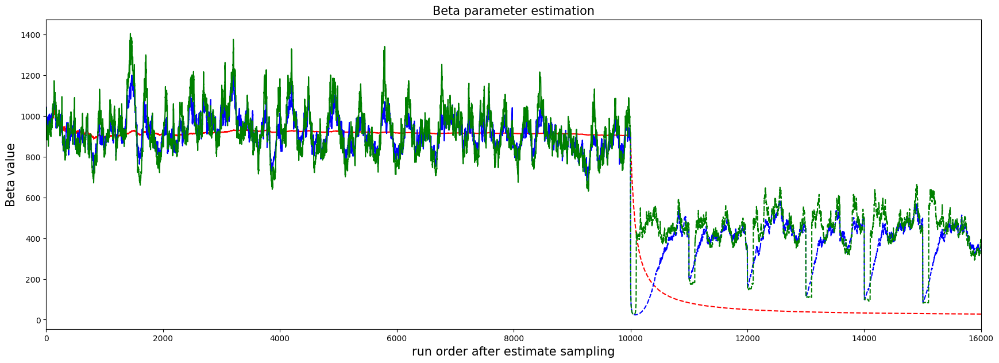

In [61]:
plt.figure(figsize=(21,7))
plt.xlim(0, 16000)
plt.plot(range(len(stable_sample)), beta_estimates_proposed[:stable_sample.shape[0]], 'r-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), beta_estimates_proposed[-novelty_sample.shape[0]-1:], 'r--')
plt.plot(range(len(stable_sample)), beta_estimates_truncated[:stable_sample.shape[0]], 'b-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), beta_estimates_truncated[-novelty_sample.shape[0]-1:], 'b--')
plt.plot(range(len(stable_sample)), beta_estimates_window[:stable_sample.shape[0]], 'g-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), beta_estimates_window[-novelty_sample.shape[0]-1:], 'g--')
plt.title("Beta parameter estimation", fontsize='15')
plt.xlabel('run order after estimate sampling', fontsize='15')
plt.ylabel('Beta value', fontsize='15')
plt.show()

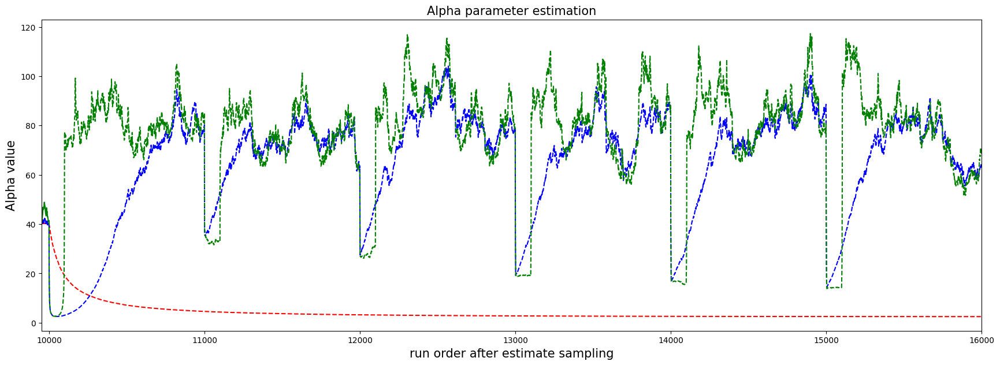

In [62]:
plt.figure(figsize=(21,7))
plt.xlim(9950, 16000)
plt.plot(range(len(stable_sample)), alpha_estimates_proposed[:stable_sample.shape[0]], 'r-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), alpha_estimates_proposed[-novelty_sample.shape[0]-1:], 'r--')
plt.plot(range(len(stable_sample)), alpha_estimates_truncated[:stable_sample.shape[0]], 'b-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), alpha_estimates_truncated[-novelty_sample.shape[0]-1:], 'b--')
plt.plot(range(len(stable_sample)), alpha_estimates_window[:stable_sample.shape[0]], 'g-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), alpha_estimates_window[-novelty_sample.shape[0]-1:], 'g--')
plt.title("Alpha parameter estimation", fontsize='15')
plt.xlabel('run order after estimate sampling', fontsize='15')
plt.ylabel('Alpha value', fontsize='15')
plt.show()

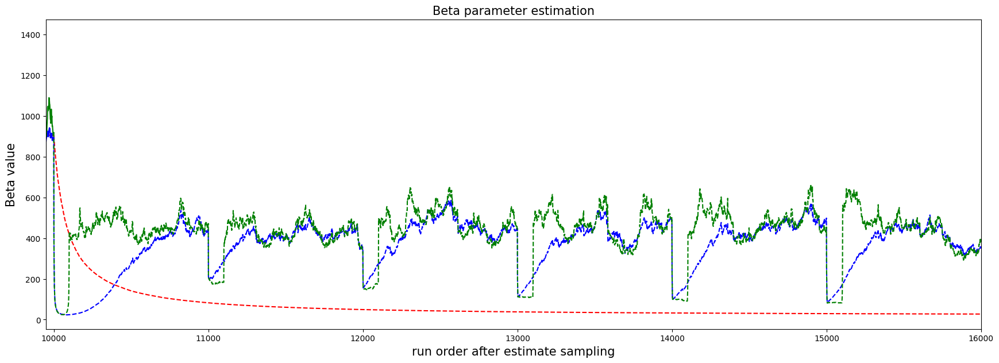

In [63]:
plt.figure(figsize=(21,7))
plt.xlim(9950, 16000)
plt.plot(range(len(stable_sample)), beta_estimates_proposed[:stable_sample.shape[0]], 'r-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), beta_estimates_proposed[-novelty_sample.shape[0]-1:], 'r--')
plt.plot(range(len(stable_sample)), beta_estimates_truncated[:stable_sample.shape[0]], 'b-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), beta_estimates_truncated[-novelty_sample.shape[0]-1:], 'b--')
plt.plot(range(len(stable_sample)), beta_estimates_window[:stable_sample.shape[0]], 'g-')
plt.plot(range(len(stable_sample)-1,len(stable_sample)+len(novelty_sample)), beta_estimates_window[-novelty_sample.shape[0]-1:], 'g--')
plt.title("Beta parameter estimation", fontsize='15')
plt.xlabel('run order after estimate sampling', fontsize='15')
plt.ylabel('Beta value', fontsize='15')
plt.show()

In [64]:
from src.change_detector.control_state import ControlState
import pandas as pd
from scipy.stats import beta
from scipy.spatial.distance import jensenshannon
from src.change_detector.stats_and_distance.stats_and_distance import JSD_distance, iter_geo_mean_estimator

class PDFChangeDetector:
    def __init__(self, a_memory:float=0.5, z1=0.68, z2=0.95, z3=0.997) -> None:
        
        #quantile parameters
        self._z1 = z1
        self._z2 = z2
        self._z3 = z3
        
        # alpha fading memory parameter and attributes
        self.a_memory:float = a_memory
        self._alpha_fading_pdf:pd.Series|None = None
        
        # Beta distribution parameters
        self._estimated_alpha:float|None = None
        self._estimated_beta:float|None = None
        
        # Stochastic process parameters and attributes
        self._run_order = 1
        
        self._reference_PDF = None
        
        self._dist_geo_mean:float|None = None
        self._complementary_dist_geo_mean:float|None = None
        
        self._min_u1 = None
        self._min_u2 = None
        self._min_u3 = None
        
        
        
    def _update_alpha_fading_pdf(self, 
                            current_pdf:pd.Series
                            ) -> None:
        damped_hist = self._alpha_fading_pdf*self.a_memory
        self._alpha_fading_pdf = (damped_hist + current_pdf)/(1+self.a_memory)
        
    @property
    def alpha_fading_pdf(self) -> pd.Series|None:
        return self._alpha_fading_pdf
        
    def _update_beta_distribution_parameters(self,
                                new_dist: float, 
                                # order:int, 
                                # old_dist_geo_mean:float, 
                                # old_complementary_dist_geo_mean:float
                                ) -> None:
        
        if self._run_order == 1:
            self._dist_geo_mean, self._complementary_dist_geo_mean = new_dist, 1-new_dist
        else:    
            self._update_geo_mean_estimators(new_dist)
            self._estimated_alpha = 1/2*(1+self._dist_geo_mean/(1-self._dist_geo_mean-self._complementary_dist_geo_mean))
            self._estimated_beta =  1/2*(1+self._complementary_dist_geo_mean/(1-self._dist_geo_mean-self._complementary_dist_geo_mean))
        # print("new alpha:", self._estimated_alpha, "  new beta:", self._estimated_beta)
        # print("geo_mean:", self._dist_geo_mean, "  complementary geo_mean:", self._complementary_dist_geo_mean)
            
    def _reset_detector_parameters(self, ref_PDF:pd.Series) -> None:
        self._estimated_alpha = None
        self._estimated_beta = None
        self._dist_geo_mean = None
        self._complementary_dist_geo_mean = None
        self._run_order = 1
        self._alpha_fading_pdf = None
        self._reference_PDF = ref_PDF
        self._alpha_fading_pdf = ref_PDF
        self._min_u1, self._min_u2, self._min_u3 = None, None, None
        
    def _update_geo_mean_estimators(self, new_dist: float) ->None:
        self._dist_geo_mean, self._complementary_dist_geo_mean = (
            iter_geo_mean_estimator(x1, self._run_order, x2) for x1, x2 in
            [(new_dist, self._dist_geo_mean), (1-new_dist, self._complementary_dist_geo_mean)]
        )
    
    def detect_change(self,new_pdf:pd.Series) -> tuple[ControlState, float|None, float|None]:
        
        if self._reference_PDF is None:
            self._reset_detector_parameters(new_pdf)
            # print("First pdf taken as reference.")
            return ControlState.IN_CONTROL, self._estimated_alpha, self._estimated_beta
        else:
            self._update_alpha_fading_pdf(new_pdf)
            pdf_dist = JSD_distance(self._reference_PDF, self._alpha_fading_pdf)
            # print("PDF distance:", pdf_dist, "current_order:", self._run_order)
            # print("JSD_distance:", jensenshannon(self._reference_PDF, self._alpha_fading_pdf, base=2)) # alternatively
            self._update_beta_distribution_parameters(pdf_dist)
            self._run_order += 1
            if not all([self._estimated_alpha, self._estimated_beta]):
                # print("Only one distance estimator is available.")
                return ControlState.IN_CONTROL, self._estimated_alpha, self._estimated_beta
            u1, u2, u3 = map(lambda x: beta.ppf(x, self._estimated_alpha, self._estimated_beta), 
                            map(lambda x: (1+x)/2,
                                [self._z1, self._z2, self._z3]))
            if not any([self._min_u1, self._min_u2, self._min_u3]) or u1 < self._min_u1:
                self._min_u1, self._min_u2, self._min_u3 = u1, u2, u3
            # print("current u1:", u1)
            # print("min u1:", self._min_u1, "  min u2:", self._min_u2, "  min u3:", self._min_u3)
            if u1 < self._min_u2:
                return ControlState.IN_CONTROL, self._estimated_alpha, self._estimated_beta
            elif u1 < self._min_u3:
                return ControlState.WARNING, self._estimated_alpha, self._estimated_beta
            else:
                self._reset_detector_parameters(new_pdf)
                # print("Out of control. New pdf taken as reference.")
                return ControlState.OUT_OF_CONTROL, self._estimated_alpha, self._estimated_beta